# Binary classification based on Logistic Regression using non-linear regression function

## import library

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

## load data

In [2]:
fname_data1 = 'assignment_09_data1.txt'
fname_data2 = 'assignment_09_data2.txt'

data1 = np.genfromtxt(fname_data1, delimiter=',')
data2 = np.genfromtxt(fname_data2, delimiter=',')

data1_x = data1[: , 0]
data1_y = data1[: , 1]
data1_label = data1[:, 2]

data2_x = data2[: , 0]
data2_y = data2[: , 1]
data2_label = data2[: , 2]



# data[:,0] : x
# data[:,1] : y
# data[:,2] : label {0, 1}

## plot the data

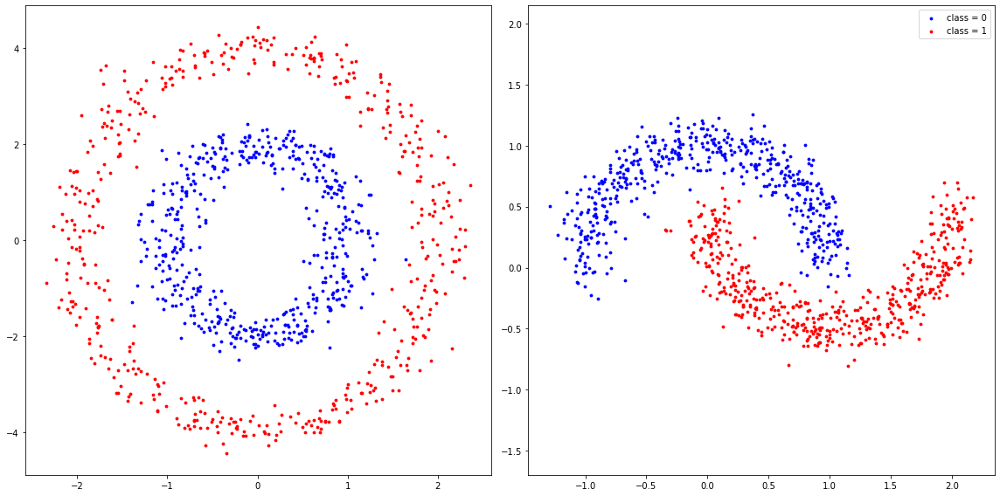

In [3]:
    plt.figure(figsize=(16,8))

    plt.subplot(121)
    class_0 = np.where(data1_label == 0)
    class_1 = np.where(data1_label == 1)
    plt.scatter(data1_x[class_0], data1_y[class_0], label = 'class = 0', color='blue', s=8)
    plt.scatter(data1_x[class_1], data1_y[class_1], label = 'class = 1', color='red',s=8)


    plt.subplot(122)
    class_0 = np.where(data2_label == 0)
    class_1 = np.where(data2_label == 1)
    plt.scatter(data2_x[class_0], data2_y[class_0], label = 'class = 0', color='blue', s=8)
    plt.scatter(data2_x[class_1], data2_y[class_1], label = 'class = 1', color='red',s=8)

    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

## define the feature function for each data to obtain the best accuracy

In [4]:
x = [1,2,3]
one = np.ones(1000)
print(np.vstack(np.vstack((one,data1_x, data1_y))))



[[ 1.       1.       1.      ...  1.       1.       1.     ]
 [ 0.83159  0.87196  1.01934 ...  2.01992  2.30028  1.82426]
 [-0.33906  0.24418  0.23241 ... -0.31388  0.22118 -0.14913]]


In [5]:
def feature_function1(x, y): # 행렬 모양 생각

    oneVector = np.ones(x.shape)
    feature = np.vstack((oneVector, np.power(x,2), np.power(y,2)))
    return feature
print(feature_function1(data1_x, data1_y))


[[1.         1.         1.         ... 1.         1.         1.        ]
 [0.69154193 0.76031424 1.03905404 ... 4.08007681 5.29128808 3.32792455]
 [0.11496168 0.05962387 0.05401441 ... 0.09852065 0.04892059 0.02223976]]


In [6]:
def feature_function2(x, y):
    # 1, x, x^2, x^3 - y
    oneVector = np.ones(x.shape)
    feature = np.vstack((oneVector, x ,np.power(x,2), np.power(x,3), y))
    return feature
print(feature_function2(data2_x, data2_y))

[[ 1.00000000e+00  1.00000000e+00  1.00000000e+00 ...  1.00000000e+00
   1.00000000e+00  1.00000000e+00]
 [ 7.60900000e-01  1.13638000e+00  1.06430000e+00 ...  3.64300000e-02
   7.23000000e-03 -3.40000000e-02]
 [ 5.78968810e-01  1.29135950e+00  1.13273449e+00 ...  1.32714490e-03
   5.22729000e-05  1.15600000e-03]
 [ 4.40537368e-01  1.46747511e+00  1.20556932e+00 ...  4.83478887e-05
   3.77933067e-07 -3.93040000e-05]
 [-3.70100000e-02 -6.51000000e-03 -6.77300000e-02 ...  4.68570000e-01
   2.67470000e-01  5.10570000e-01]]


## define regression function with a vector $\theta$ model parameters and input data 

In [7]:
def regression_function(theta, feature):
    value = np.matmul(theta, feature)
    return value


## define sigmoid function with input $x$

In [8]:
def logistic_function(x):
    z = 1 / (1+ np.exp(-x))
    return z

## define loss function with feature and label based on the logistic regression

In [9]:
def compute_loss_feature(theta, feature, label):
    f = np.matmul(theta, feature)
    h = logistic_function(f)

    loss = np.sum((-label * np.log(h)) - ((1-label) * np.log(1-h))) / 1000
    return loss

## define gradient vector for the model parameters $\theta$

In [10]:
def compute_gradient_feature(theta, feature, label):
    f = np.matmul(theta, feature)

    h = logistic_function(f)
    residual = h - label
    oneVector = np.ones(1000)
    xList = np.vstack((feature))
    xList = np.transpose(xList)
    gradient = (np.dot(residual, xList)) / 1000
   
    return gradient

feature1 = feature_function1(data1_x, data1_y)
compute_gradient_feature([0,0,0], feature1, data1_label)

array([ 0.        , -0.37998722, -1.47572355])

## compute the accuracy

In [11]:
x = np.array([[1,2,3],[4,5,7]])
y = np.array([[1,2,3],[4,5,6]])
result = np.array([1,2,3,4,5,6,67,8,10,11])

index = (x == y)

print(len(index[index == True]))


5


In [12]:
def compute_accuracy(theta, feature, label):
    predict_label = logistic_function(regression_function(theta, feature))
    predict_label[predict_label >= 0.5] = 1
    predict_label[predict_label < 0.5 ] = 0
    correct_label_number = predict_label == label
    accuracy = len(correct_label_number[correct_label_number == True]) / feature.shape[1]

    return accuracy


## gradient descent for the model parameters $\theta$

In [88]:
num_iteration   = 30000         # USE THIS VALUE for the number of gradient descent iterations 
learning_rate   = 0.3           # USE THIS VALUE for the learning rate
theta1           = np.array((0, 0, 0))  
theta2           = np.array((0,0,0,0,0))

theta1_iteration = np.zeros((num_iteration, theta1.size))
theta2_iteration = np.zeros((num_iteration, theta2.size))

loss1_iteration  = np.zeros(num_iteration)
loss2_iteration  = np.zeros(num_iteration)

feature1 = feature_function1(data1_x, data1_y)
feature2 = feature_function2(data2_x, data2_y)


In [89]:
for i in range(num_iteration):
    theta1  = theta1 - learning_rate * compute_gradient_feature(theta1, feature1, data1_label)
    loss1    = compute_loss_feature(theta1, feature1, data1_label)

    theta2 = theta2 - learning_rate * compute_gradient_feature(theta2, feature2, data2_label)
    loss2 = compute_loss_feature(theta2, feature2, data2_label)

    theta1_iteration[i] = theta1
    loss1_iteration[i] = loss1

    theta2_iteration[i] = theta2
    loss2_iteration[i] = loss2

    
theta1_optimal = theta1
theta2_optimal = theta2
print(compute_accuracy(theta1_optimal, feature1, data1_label))
print(compute_accuracy(theta2_optimal, feature2, data2_label))

0.999
0.994


[  8.32684901  -3.72378331 -18.8629841   12.4357847  -13.29958739]


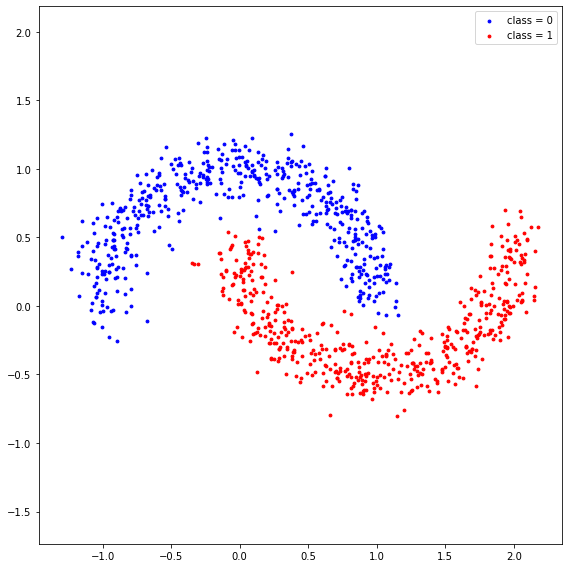

In [15]:
    print(theta2_optimal)
    feature2 = feature_function2(data2_x, data2_y)
    x2 = regression_function(theta2_optimal, feature2)
    predict_label = logistic_function(x2)

    plt.figure(figsize=(8,8))

    class_0 = np.where(predict_label < 0.5)
    class_1 = np.where(predict_label >= 0.5)
    plt.scatter(data2_x[class_0], data2_y[class_0], label = 'class = 0', color='blue', s=8)
    plt.scatter(data2_x[class_1], data2_y[class_1], label = 'class = 1', color='red',s=8)

    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [16]:
    print(theta1_optimal)
    feature = feature_function1(data1_x, data1_y)
    x = regression_function(theta1_optimal, feature)
    predict_label = logistic_function(x)


[-15.60965121   6.25061426   1.88431162]


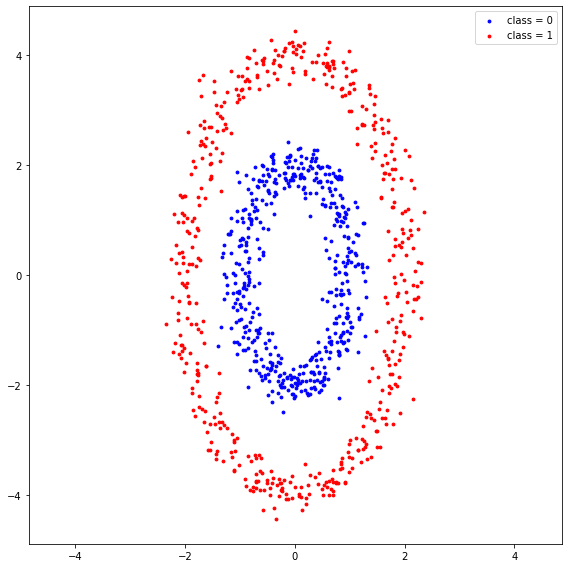

In [17]:
    plt.figure(figsize=(8,8))

    class_0 = np.where(predict_label < 0.5)
    class_1 = np.where(predict_label >= 0.5)
    plt.scatter(data1_x[class_0], data1_y[class_0], label = 'class = 0', color='blue', s=8)
    plt.scatter(data1_x[class_1], data1_y[class_1], label = 'class = 1', color='red',s=8)

    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

## compute accuracy of the classifiers

In [18]:
accuracy_classifier1 = compute_accuracy(theta1_optimal, feature1, data1_label)
#accuracy_classifier2 = compute_accuracy(theta2_optimal, feature2, label2)

## plot the results

In [19]:
def plot_loss_curve(loss_iteration):

    plt.figure(figsize=(8,6))   # USE THIS VALUE for the size of the figure

    plt.title('loss')

    plt.plot(range(0, len(loss_iteration)), loss_iteration, '-', color='red')

    plt.xlabel('iteration')
    plt.ylabel('loss')

    plt.tight_layout()
    plt.show()

In [20]:
def plot_data(data):
    
    plt.figure(figsize=(8,8))   # USE THIS VALUE for the size of the figure
    data_x = data[: , 0]
    data_y = data[: , 1]
    data_label = data[:, 2]

    class_0 = np.where(data_label == 0)
    class_1 = np.where(data_label == 1)
    plt.scatter(data_x[class_0], data_y[class_0], label = 'class = 0', color='blue', s=8)
    plt.scatter(data_x[class_1], data_y[class_1], label = 'class = 1', color='red',s=8)

    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [21]:

def plot_model_parameter(theta_iteration):

    plt.figure(figsize=(8,6))
    plt.title('model parameter')

    plt.plot(range(0, len(theta_iteration)), theta_iteration[:, 0], '-', color='red', label=r"${\theta_0}$")
    plt.plot(range(0, len(theta_iteration)), theta_iteration[:, 1], '-', color='green', label=r"${\theta_1}$")
    plt.plot(range(0, len(theta_iteration)), theta_iteration[:, 2], '-', color='blue', label=r"${\theta_2}$")

    plt.xlabel('iteration')
    plt.legend(loc='center right')

    plt.tight_layout()
    plt.show()

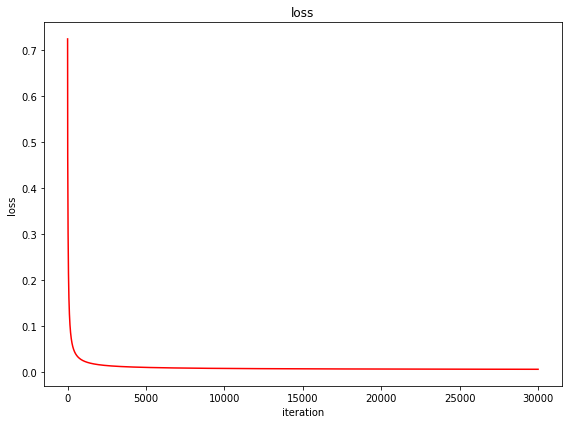

In [22]:
plot_loss_curve(loss1_iteration)

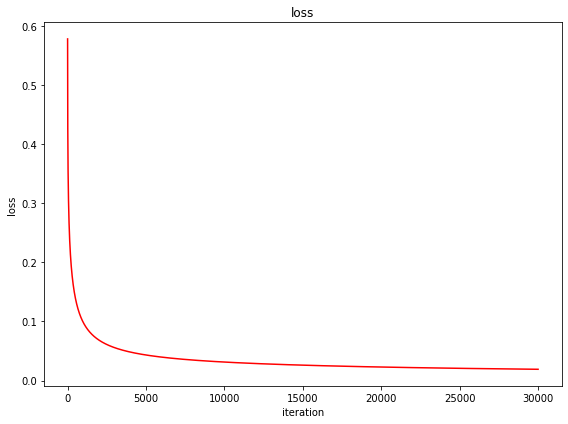

In [23]:
plot_loss_curve(loss2_iteration)

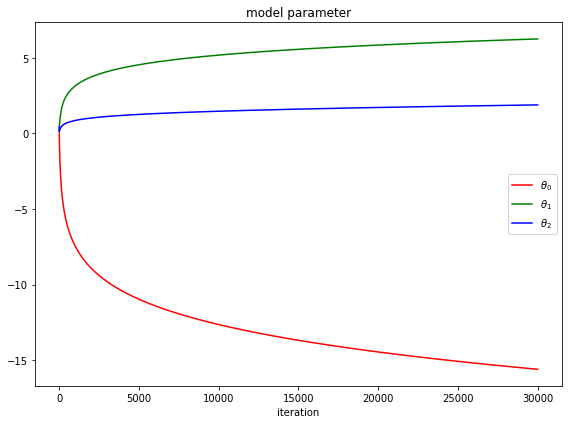

In [24]:
plot_model_parameter(theta1_iteration)

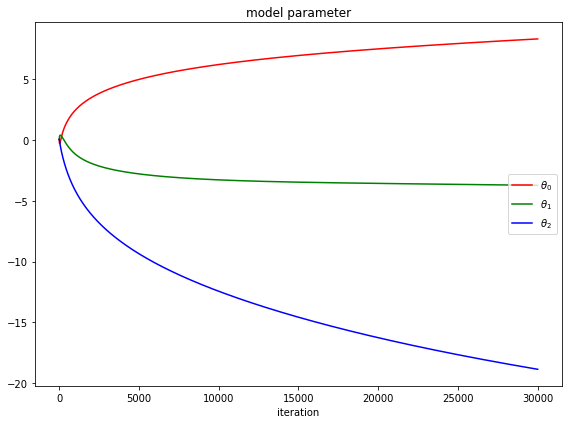

In [25]:
plot_model_parameter(theta2_iteration)

In [80]:
def plot_classifier1(data, theta):
    
    plt.figure(figsize=(8,8)) # USE THIS VALUE for the size of the figure

    x = np.arange(-3, 3, 0.01)
    y = np.arange(-5, 5, 0.01)

    X_grid, Y_grid = np.meshgrid(x, y)
    
    label_grid = np.zeros((len(y),len(x)))
    for i in range(0, len(y)):
        for j in range(0, len(x)):
            feature_grid = feature_function1(X_grid[i][j], Y_grid[i][j])
            label_grid[i][j] = np.matmul(theta, feature_grid) 

    cntr = plt.contourf(X_grid, Y_grid, label_grid, levels=np.arange(-20,20,1), cmap="RdBu_r")
    plt.colorbar(cntr)
    
    data_x = data[: , 0]
    data_y = data[: , 1]
    data_label = data[:, 2]

    class_0 = np.where(data_label == 0)
    class_1 = np.where(data_label == 1)
    plt.scatter(data_x[class_0], data_y[class_0], label = 'class = 0', color='blue', s=8)
    plt.scatter(data_x[class_1], data_y[class_1], label = 'class = 1', color='red',s=8)
    

    feature_x = np.arange(-1.6, 1.6, 0.01)
    feature_y = np.sqrt((-theta[1] * np.power(feature_x , 2) - theta[0]) / theta[2])
    feature_y = np.nan_to_num(feature_y)
    plt.plot(feature_x, feature_y, '-' , color='k')
    plt.plot(feature_x, -feature_y, '-' , color='k')


    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [82]:
def plot_classifier2(data, theta):
    plt.figure(figsize=(8,8)) # USE THIS VALUE for the size of the figure

    x = np.arange(-1.7, 2.5, 0.01)
    y = np.arange(-1.25, 1.25, 0.01)

    X_grid, Y_grid = np.meshgrid(x, y)
    
    label_grid = np.zeros((len(y),len(x)))
    for i in range(0, len(y)):
        for j in range(0, len(x)):
            feature_grid = feature_function2(X_grid[i][j], Y_grid[i][j])
            label_grid[i][j] = regression_function(theta, feature_grid)

    cntr = plt.contourf(X_grid, Y_grid, label_grid, levels=np.arange(-20,20,1), cmap="RdBu_r")
    plt.colorbar(cntr)
    
    data_x = data[: , 0]
    data_y = data[: , 1]
    data_label = data[:, 2]

    class_0 = np.where(data_label == 0)
    class_1 = np.where(data_label == 1)
    plt.scatter(data_x[class_0], data_y[class_0], label = 'class = 0', color='blue', s=8)
    plt.scatter(data_x[class_1], data_y[class_1], label = 'class = 1', color='red',s=8)

    feature_y = -(theta[0] + theta[1] * x + theta[2] * np.power(x,2) + theta[3] * np.power(x,3))/theta[4]


    plt.plot(x, feature_y, '-' , color='k')


    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.axis([-2, 2.5, -2, 2])
    plt.show()

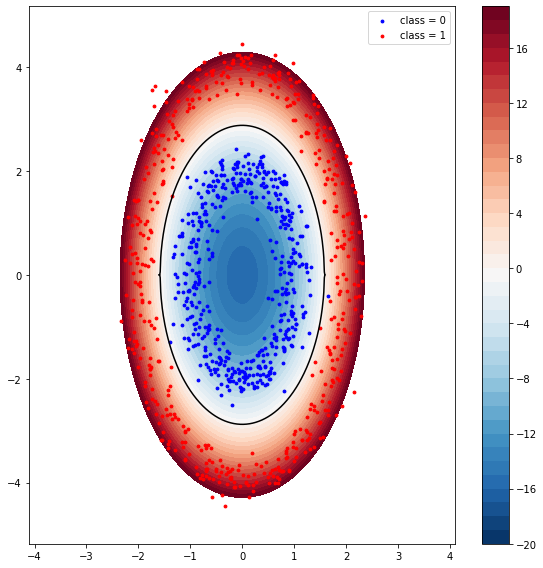

In [81]:
plot_classifier1(data1, theta1_optimal)

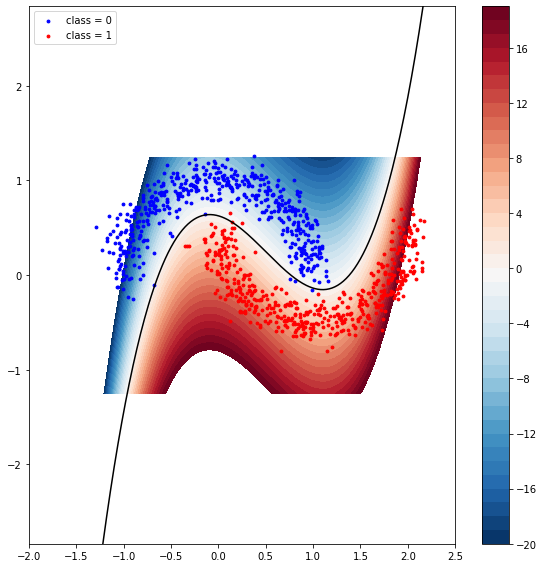

In [83]:
plot_classifier2(data2, theta2_optimal)

# * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

# * results

# * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

### # 01. plot the input data (data1) from the file [assignment_09_data1.txt] in blue for class 0 and in red for class 1

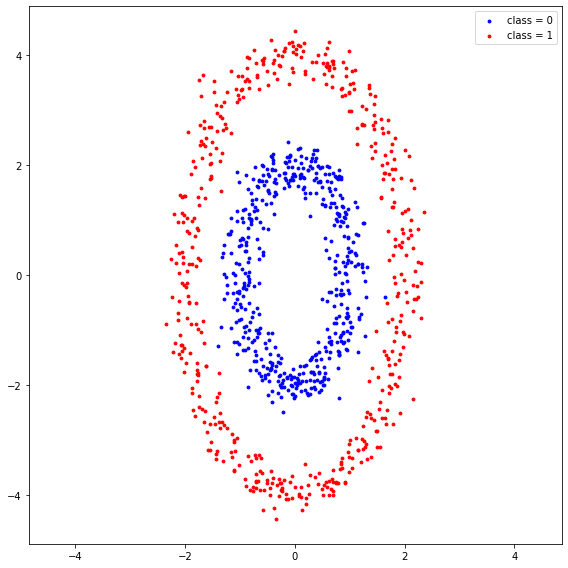

In [417]:
plot_data(data1)

### # 02. plot the input data (data2) from the file [assignment_09_data2.txt] in blue for class 0 and in red for class 1

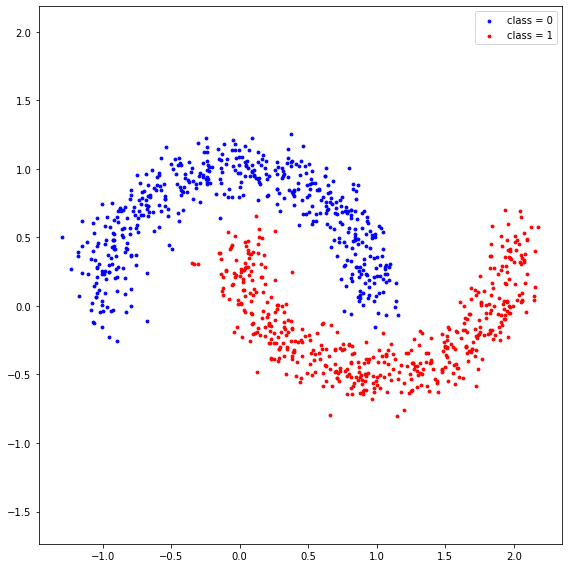

In [418]:
plot_data(data2)

### # 03. plot the values of the model parameters $\theta$ as curves over the gradient descent iterations using different colors for data1

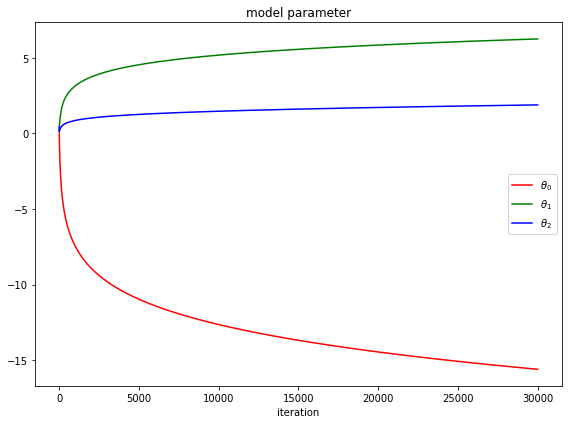

In [419]:
plot_model_parameter(theta1_iteration)

### # 04. plot the values of the model parameters $\theta$ as curves over the gradient descent iterations using different colors for data2

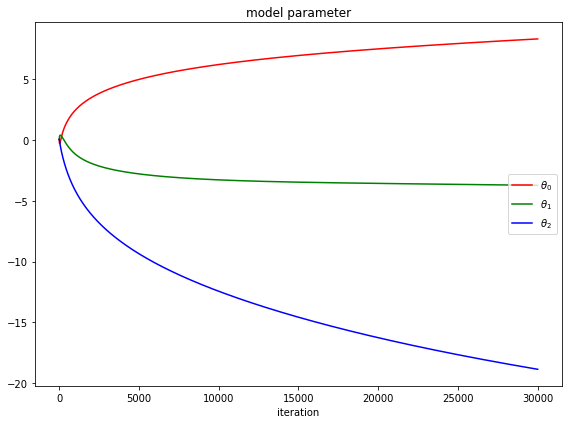

In [420]:
plot_model_parameter(theta2_iteration)

### # 05. plot the loss values in red curve over the gradient descent iterations for data1

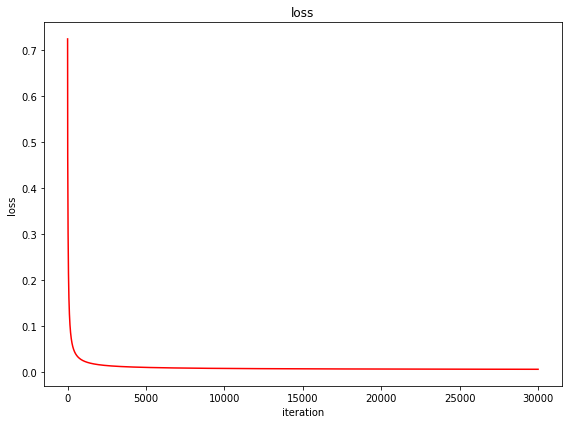

In [421]:
plot_loss_curve(loss1_iteration)

### # 06. plot the loss values in red curve over the gradient descent iterations for data2

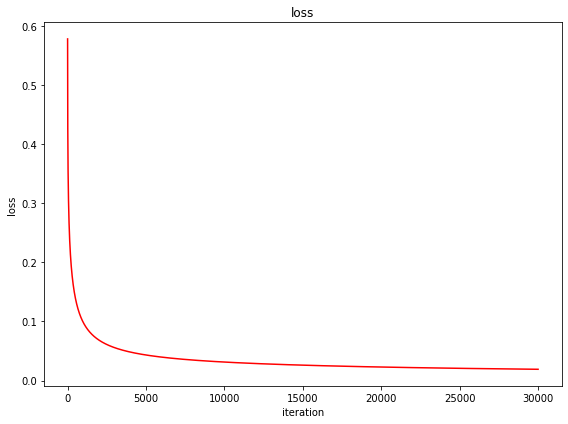

In [422]:
plot_loss_curve(loss2_iteration)

### # 07. plot the classifier with the given data points superimposed for data1

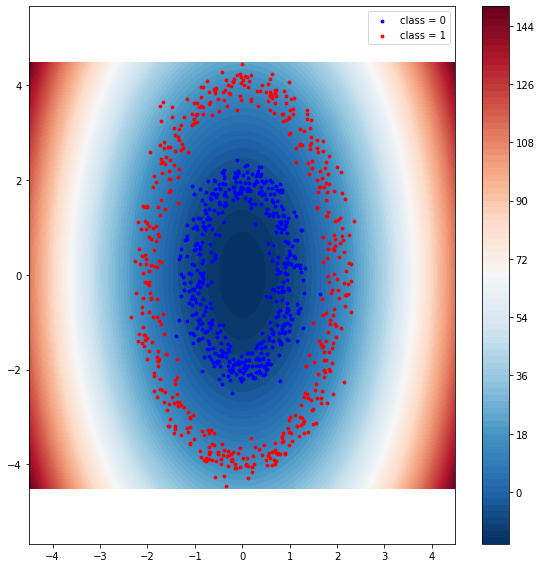

In [423]:
plot_classifier1(data1, theta1_optimal)

### # 08. plot the classifier with the given data points superimposed for data2

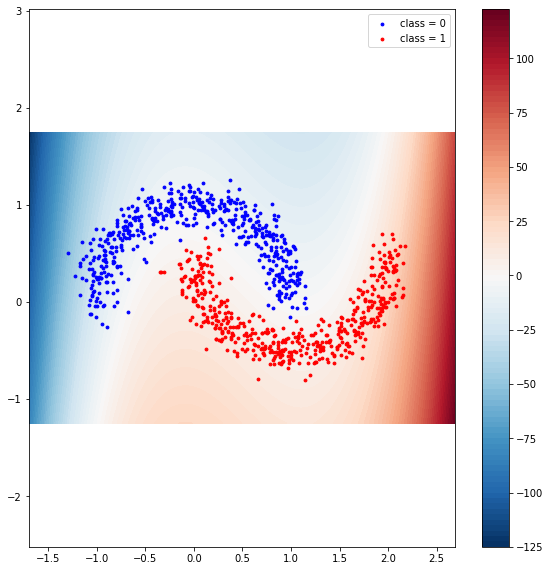

In [424]:
plot_classifier2(data2, theta2_optimal)

### # 09. print out the accuracy of the obtained classifier1 for data1

In [425]:
print(accuracy_classifier1)

0.999


### # 10. print out the accuracy of the obtained classifier2 for data1

In [426]:
print(accuracy_classifier2)

NameError: name 'accuracy_classifier2' is not defined